In [2]:
import pandas as pd
pd.set_option('display.max_columns', 500)
import numpy as np
import plotly.express as px
import geopandas as gpd
from geopandas import GeoDataFrame
from shapely.geometry import Point
from matplotlib import pyplot as plt
import folium
import geopandas as gpd

In [3]:
#Read gdf file
gdf = gpd.read_file("gemeente_2022.geojson")#/[['statcode', 'statnaam', 'geometry']]
gdf.sample(5)

,id,statcode,statnaam,jrstatcode,rubriek,FID,geometry
86,GM0312,GM0312,Bunnik,2022GM0312,gemeente,cbs_gemeente_2022_gegeneraliseerd.87,"POLYGON ((5.19500 52.07700, 5.24700 52.05900, ..."
84,GM0308,GM0308,Baarn,2022GM0308,gemeente,cbs_gemeente_2022_gegeneraliseerd.85,"POLYGON ((5.33100 52.21500, 5.31400 52.20300, ..."
230,GM0866,GM0866,Waalre,2022GM0866,gemeente,cbs_gemeente_2022_gegeneraliseerd.231,"POLYGON ((5.50500 51.40000, 5.51600 51.37800, ..."
212,GM0797,GM0797,Heusden,2022GM0797,gemeente,cbs_gemeente_2022_gegeneraliseerd.213,"POLYGON ((5.18600 51.74200, 5.20600 51.74100, ..."
344,GM1991,GM1991,Maashorst,2022GM1991,gemeente,cbs_gemeente_2022_gegeneraliseerd.345,"POLYGON ((5.75000 51.62300, 5.66500 51.62800, ..."


In [5]:
shp = 'Data/countries.shp'
countries = gpd.read_file(shp)

# Geospatial Visualization

## World Happiness Country

In [15]:
speeches_df = pd.read_csv('preprocessed_dataframe.csv')
countries_gdf = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

In [16]:
def interpolate(df, col, country):
    minidf = pd.DataFrame({col : df[col].loc[:,country].interpolate(method='slinear')})
    minidf['country'] = country
    minidf = minidf.reset_index()
    minidf.set_index(['year', 'country'], inplace=True)
    return df.update(minidf)

countries = speeches_df.reset_index()['country'].unique()
cols = ['Life Ladder', 'Log GDP per capita', 'Social support',
        'Healthy life expectancy at birth', 'Freedom to make life choices',
        'Generosity', 'Perceptions of corruption', 'Positive affect', 
        'Negative affect']

def multi_interpolate(df, columns, countries):
    for country in countries:
        for column in columns:
            try:
                interpolate(df, column, country)
            except:
                print(f"FAIL: {country} : {column}")
    return df


multi_interpolate(speeches_df, cols, countries)

FAIL: ALB : Life Ladder
FAIL: ALB : Log GDP per capita
FAIL: ALB : Social support
FAIL: ALB : Healthy life expectancy at birth
FAIL: ALB : Freedom to make life choices
FAIL: ALB : Generosity
FAIL: ALB : Perceptions of corruption
FAIL: ALB : Positive affect
FAIL: ALB : Negative affect
FAIL: ARG : Life Ladder
FAIL: ARG : Log GDP per capita
FAIL: ARG : Social support
FAIL: ARG : Healthy life expectancy at birth
FAIL: ARG : Freedom to make life choices
FAIL: ARG : Generosity
FAIL: ARG : Perceptions of corruption
FAIL: ARG : Positive affect
FAIL: ARG : Negative affect
FAIL: AUS : Life Ladder
FAIL: AUS : Log GDP per capita
FAIL: AUS : Social support
FAIL: AUS : Healthy life expectancy at birth
FAIL: AUS : Freedom to make life choices
FAIL: AUS : Generosity
FAIL: AUS : Perceptions of corruption
FAIL: AUS : Positive affect
FAIL: AUS : Negative affect
FAIL: AUT : Life Ladder
FAIL: AUT : Log GDP per capita
FAIL: AUT : Social support
FAIL: AUT : Healthy life expectancy at birth
FAIL: AUT : Freedo

,Unnamed: 0.1,Unnamed: 0,session_nr,year,country,word_count,pos_sentiment,neu_sentiment,neg_sentiment,average_sentence_length,most_used_words,speech,preprocessed_speech,Global Code,Global Name,Region Code,Region Name,Sub-region Code,Sub-region Name,Intermediate Region Code,Intermediate Region Name,Country or Area,M49 Code,ISO-alpha2 Code,ISO-alpha3 Code,Least Developed Countries (LDC),Land Locked Developing Countries (LLDC),Small Island Developing States (SIDS),Developed / Developing Countries,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,Negative affect
0,0,0,25,1970,ALB,4022,0.155,0.735,0.110,754.176471,"(['people', 'imperialist', 'struggle', 'soviet...",May I first convey to our President the congra...,may first convey president congratulation alba...,1.0,World,150.0,Europe,39.0,Southern Europe,NaN,NaN,Albania,8.0,AL,ALB,NaN,NaN,NaN,Developed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1,25,1970,ARG,2311,0.171,0.745,0.084,540.277778,"(['nation', 'international', 'united', 'state'...",It is a fortunate coincidence that precisely a...,fortunate coincidence precisely time united na...,1.0,World,19.0,Americas,419.0,Latin America and the Caribbean,5.0,South America,Argentina,32.0,AR,ARG,NaN,NaN,NaN,Developing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2,25,1970,AUS,2531,0.145,0.772,0.083,422.466667,"(['nation', 'united', 'development', 'country'...","It is a pleasure for me to extend to you, Mr. ...",pleasure extend president warm congratulation ...,1.0,World,9.0,Oceania,53.0,Australia and New Zealand,NaN,NaN,Australia,36.0,AU,AUS,NaN,NaN,NaN,Developed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,3,25,1970,AUT,2134,0.202,0.737,0.061,564.234043,"(['state', 'nation', 'united', 'international'...",May I begin by expressing to Ambassador Hambro...,may begin express ambassador hambro behalf del...,1.0,World,150.0,Europe,155.0,Western Europe,NaN,NaN,Austria,40.0,AT,AUT,NaN,NaN,NaN,Developed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,4,25,1970,BEL,2009,0.163,0.793,0.045,415.822581,"(['regional', 'security', 'country', 'charter'...","No doubt each of us, before coming up to this ...",doubt u come rostrum wonder usefulness futilit...,1.0,World,150.0,Europe,155.0,Western Europe,NaN,NaN,Belgium,56.0,BE,BEL,NaN,NaN,NaN,Developed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8493,8493,8493,75,2020,WSM,1018,0.167,0.767,0.066,289.925000,"(['un', 'samoa', 'nation', 'united', 'need', '...","Mr. President,\nDistinguished delegates,\nLadi...",president distinguish delegate lady gentleman ...,1.0,World,9.0,Oceania,61.0,Polynesia,NaN,NaN,Samoa,882.0,WS,WSM,NaN,NaN,x,Developing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8494,8494,8494,75,2020,YEM,707,0.194,0.714,0.093,437.947368,"(['people', 'united', 'nation', 'militia', 'ef...",In the name of God the Merciful and the Compas...,name god merciful compassionate excellency pre...,1.0,World,142.0,Asia,145.0,Western Asia,NaN,NaN,Yemen,887.0,YE,YEM,x,NaN,NaN,Developing,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8495,8495,8495,75,2020,ZAF,751,0.166,0.731,0.103,147.688525,"(['must', 'world', 'nation', 'pandemic', 'afri...","President of the General Assembly, Secretary-G...",president general assembly excellency lady gen...,1.0,World,2.0,Africa,202.0,Sub-Saharan Africa,18.0,Southern Africa,South Africa,710.0,ZA,ZAF,NaN,NaN,NaN,Developing,4.946801,9.332463,0.891050,57.299999,0.756946,-0.014951,0.912407,0.820338,0.294276
8496,8496,8496,75,2020,ZMB,355,0.205,0.753,0.042,153.206897,"(['president', 'united', 'nation', 'u', 'excel...","Your excellency Mr. Volkan Bozkir, President o...",excellency volkan bozkir president session uni...,1.0,World,2.0,Africa,202.0,Sub-Saharan Africa,14.0,Eastern Africa,Zambia,894.0,ZM,ZMB,x,x,NaN,Developing,4.837992,8.116580,0.766872,56.299999,0.750422,0.0

In [17]:
df_worldhappiness = pd.merge(speeches_df,countries_gdf, left_on = 'country', right_on = 'iso_a3')
df_worldhappiness['GDP per Capita']= np.exp(df_worldhappiness['Log GDP per capita'])

In [18]:
gdf_worldhappiness = GeoDataFrame(df_worldhappiness, geometry=df_worldhappiness['geometry'])
gdf_worldhappiness_point = gdf_worldhappiness.copy()
gdf_worldhappiness_point['geometry']= gdf_worldhappiness_point['geometry'].centroid
gdf_worldhappiness_point = gdf_worldhappiness_point.sort_values('year', ascending = True)

In [19]:
longitude, latitude = gdf_worldhappiness_point['geometry'].x, gdf_worldhappiness_point['geometry'].y
gdf_worldhappiness_point['longitude']= longitude
gdf_worldhappiness_point['latitude']= latitude

In [20]:
gdf_worldhappiness_2019 = gdf_worldhappiness[gdf_worldhappiness['year']==2019]
gdf_worldhappiness_point_2019 = gdf_worldhappiness_point[gdf_worldhappiness_point['year']==2019]

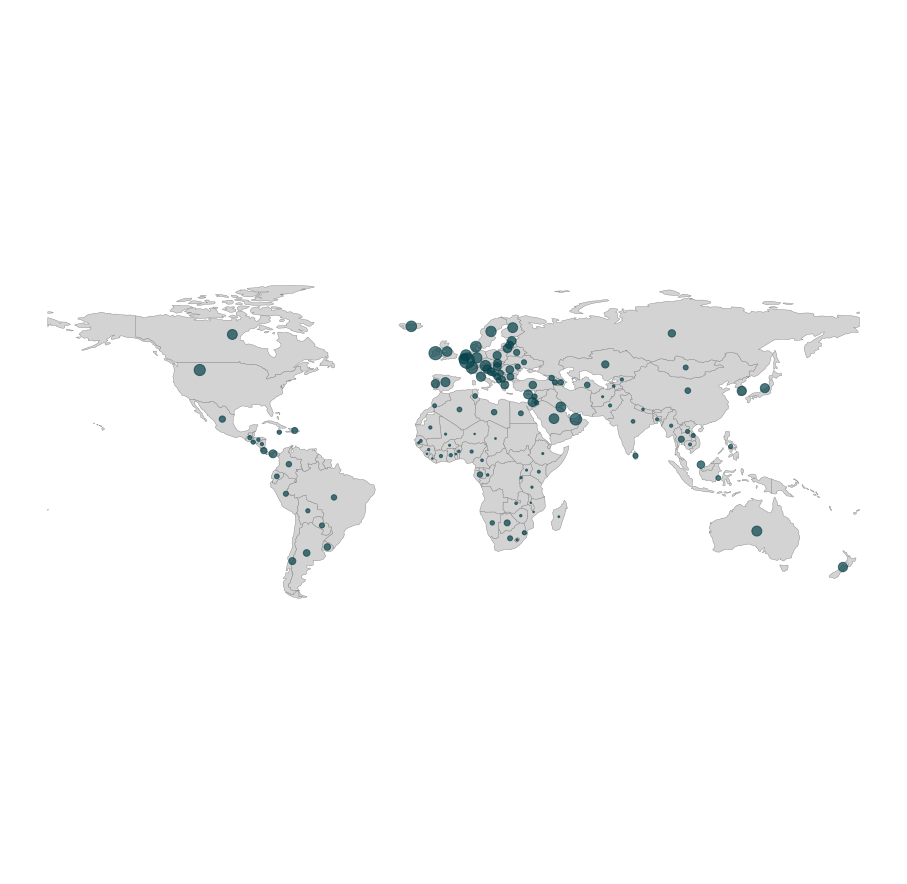

In [21]:
#bubble
fig, ax = plt.subplots(figsize=(16,16))
marker = gdf_worldhappiness_point_2019['GDP per Capita']/500
gdf_worldhappiness_2019.plot(ax=ax, color="lightgray", edgecolor="grey", linewidth=0.4)
gdf_worldhappiness_point_2019.plot(ax=ax,color="#07424A", markersize=marker,alpha=0.7, categorical=False, legend=True  )
ax.axis("off")
plt.axis('equal')
plt.show()

<AxesSubplot:>

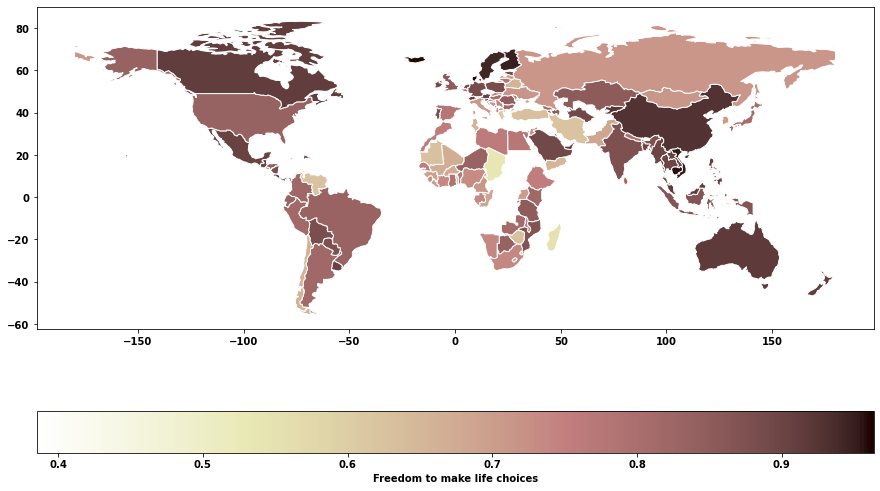

In [22]:
#choropleth
gdf_worldhappiness_2019.plot(column = "Freedom to make life choices", 
                           figsize=(15,10),
                           legend=True,
                           edgecolor="white",
                        cmap = 'pink_r',
                           legend_kwds={"label":"Freedom to make life choices", "orientation":"horizontal"})

In [28]:
#plottly
fig_scatter = px.scatter_mapbox(
    gdf_worldhappiness_point_2019.dropna(subset = 'GDP per Capita'),   
    lat="latitude", 
    lon="longitude", 
    color = 'continent',
    size= 'GDP per Capita', 
    color_continuous_scale=px.colors.cyclical.IceFire, 
    size_max=15, 
    hover_name = 'name',
    mapbox_style="carto-darkmatter",
    zoom=1)
fig_scatter.show()

In [24]:
gdf_worldhappiness_point['Land Locked Developing Countries (LLDC)'].fillna(value = 'No', inplace = True)
gdf_worldhappiness_point['Land Locked Developing Countries (LLDC)'].replace(['x'], ['Yes'], inplace=True)
gdf_worldhappiness_point['Land Locked Developing Countries (LLDC)'].unique()

array(['No', 'Yes'], dtype=object)

In [29]:
#gdf_worldhappiness_pointpx = px.data.gapminder()
fig_gdp_lifexpectancy = px.scatter(
    gdf_worldhappiness_point.dropna(subset = 'GDP per Capita'),   
    color = 'Region Name',
    size= 'GDP per Capita', 
      color_continuous_scale=px.colors.cyclical.IceFire, 
    animation_frame= "year",
     animation_group="country",
    hover_name = 'name',
    size_max=35, 
    x="GDP per Capita", y="Healthy life expectancy at birth"
 ,color_discrete_map={"Europe": 'rgba(260,0,0,0.4)'}
    ,log_x = True
)
fig_gdp_lifexpectancy.show()


# African Conflict 

In [31]:
# Conflict Dataset Points
acled = gpd.read_file(
    "./5-+Interactive+Visualization (1)/data/acled2019.shp",
    mask = countries_gdf[countries_gdf["continent"] == "Africa"]
)
acled = acled[(acled['event_type'] == 'Battles') | (acled['event_type'] == 'Violence against civilians') |
              (acled['event_type'] == 'Riots') | (acled['event_type'] == 'Explosions/Remote violence')]

In [33]:
Africa = countries_gdf[countries_gdf['continent']== 'Africa']
Africa['geometry_point'] = Africa['geometry'].centroid
Africa['geometry'] = Africa['geometry_point']
Alongitude, Alatitude = Africa['geometry'].x, Africa['geometry'].y

C:\Temp\ipykernel_10904\2998300700.py:2: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\lcu1812\Anaconda3\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [34]:
Alongitude, Alatitude = Africa['geometry'].x, Africa['geometry'].y
Africa['longitude']= Alongitude
Africa['latitude']= Alatitude

C:\Users\lcu1812\Anaconda3\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\lcu1812\Anaconda3\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



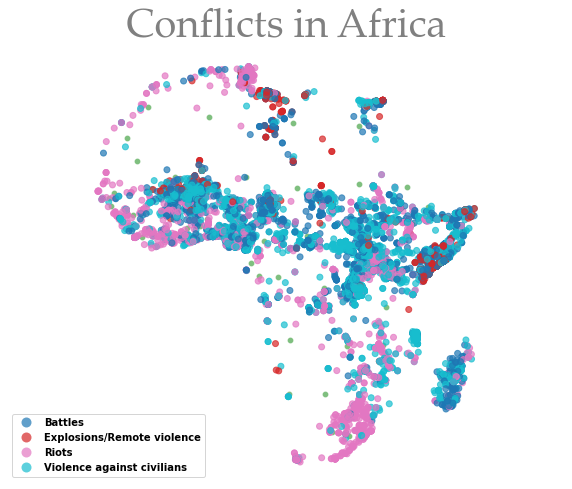

In [35]:
#multiplayer maps
fig, ax = plt.subplots(1,1,  figsize=(10,8))
Africa.plot(ax=ax, linewidth=0.5,edgecolor = 'white',facecolor = 'Green', alpha=0.5);
acled.plot(ax= ax,
           column = 'event_type',
                alpha=0.7,
          legend = 'event_type');

plt.title('Conflicts in Africa', fontsize=40, fontname="Palatino Linotype", color="grey")
ax.axis("off")
plt.axis('equal')
plt.show()

In [38]:
def color_producer(event_type):
    if event_type == 'Battles':
        return 'lightblue'
    elif event_type == 'Violence against civilians':
        return 'green'
    elif event_type == 'Riots':
        return 'pink'
    else:
        return 'red'
m = folium.Map()
geo_Africa_list = [[point.xy[1][0], point.xy[0][0]] for point in acled.geometry ]
for i, coordinates in enumerate(geo_Africa_list):
    color = color_producer(acled.event_type.iloc[i])
    folium.CircleMarker(location = coordinates, color = color, radius = 0.5
        ,popup =  f"{acled.event_type.iloc[i]}"
                       ).add_to(m)
m